**Run the cell below to import some packages.  If you get an `import error` for a package you've already installed, try changing your kernel (select the Kernel menu above --> Change Kernel).  Still have problems?  Try relaunching Jupyter Notebook from the terminal prompt.  Also, consult the forums for more troubleshooting tips.**  

## Import Packages

In [1]:
# importing some useful packages
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt

from matplotlib.patches import Polygon
from moviepy.editor import VideoFileClip
from IPython.display import HTML

%matplotlib inline

### Camera Calibration using the Chessboard Corners on the Sample Images

In [2]:
def calibrate_camera( images, nx=9, ny=6 ):
    """"
    images = paths to the images used to calibrate the camera
    nx = Number of inside corners in x
    ny = Number of inside corners in y
    """
    
    # prepare object points like (0,0,0), (1,0,0), (2,0,0) ... upto (8,5,0)
    objp = np.zeros( (nx * ny, 3), dtype = np.float32 )
    objp[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)

    # create arrays to store object points and image points from all the images
    objPoints = [] # 3D points in real space
    imgPoints = [] # 2D points in image space
  
    # loop through the list of images to find chessboard corners
    for idx, fileName in enumerate( images ):
        img = cv2.imread( fileName )
        
        # convert to grayscale image
        gray = cv2.cvtColor( img, cv2.COLOR_BGR2GRAY )
        
        # find chessboard corners (for a 9x6 board)
        ret, corners = cv2.findChessboardCorners( gray, (nx, ny), None ) 

        # if corners found, append object points, image points, and 
        # draw the detected corners on the image
        if ret == True:
            objPoints.append( objp )
            imgPoints.append( corners )
    
    # Camera calibration, given object points, image points, and the shape of the grayscale image
    if ( len(objPoints) > 0 ):
        # camera successfully calibrated
        print("Camera calibrated successfully.")
        ret, mtx, distCoeffs, rVecs, tVecs = cv2.calibrateCamera(objPoints, imgPoints, gray.shape[::-1], None, None)
    else:
        # unable to calibrate the camera
        print("Unable to calibrate the camera.")
        ret, mtx, distCoeffs, rVecs, tVecs = (None, None, None, None, None)            
        
    return ret, mtx, distCoeffs, rVecs, tVecs

In [3]:
# make a list of calibration images
images = glob.glob( "./camera_cal/calibration*.jpg" )

# call the function
ret, mtx, distCoeffs, rVecs, tVecs = calibrate_camera( images )

Camera calibrated successfully.


Below are some helper functions.

In [4]:
def plot_images( img1, title1, img2, title2 ):
    '''
    
    '''
    # visualisation
    f, (ax1, ax2) = plt.subplots( 1, 2, figsize = (20, 10) )
    f.tight_layout( )
    ax1.set_title( title1, fontsize = 20 )
    ax1.imshow( img1 )
    ax2.set_title(title2, fontsize = 20 )
    ax2.imshow( img2, cmap = "gray" )

### Undistort a Sample Image used for Camera Calibration 
Using the detected corners and image points, undistort a sample image

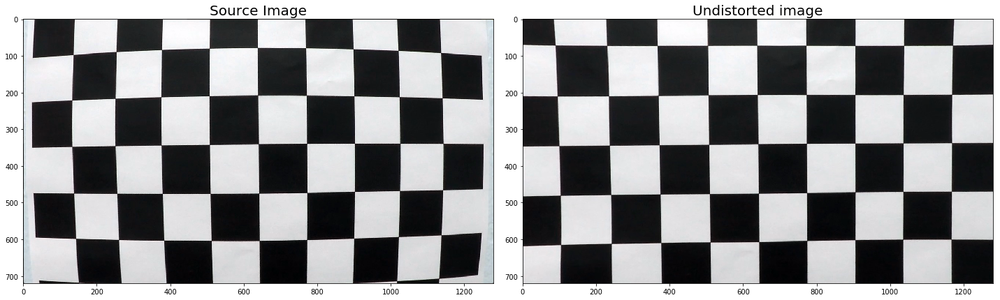

In [5]:
# undistort a sample image

distorted   = cv2.imread( "./camera_cal/calibration1.jpg" )
undistorted = cv2.undistort( distorted, mtx, distCoeffs, None, mtx)

plot_images( distorted, "Source Image", undistorted, "Undistorted image" )


### Undistort Test Images 
Using the detected corners and image points, undistort the test images 


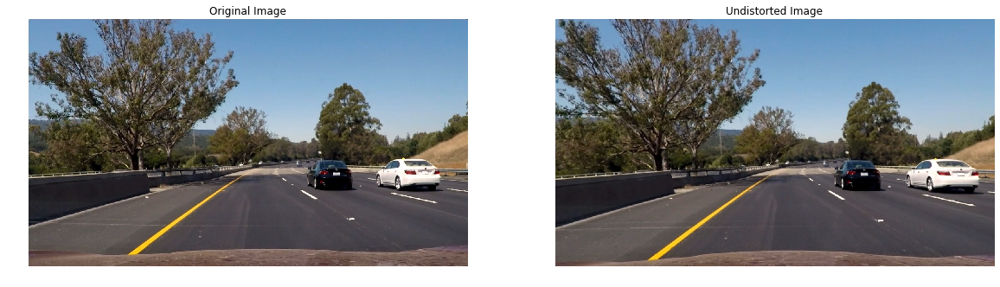

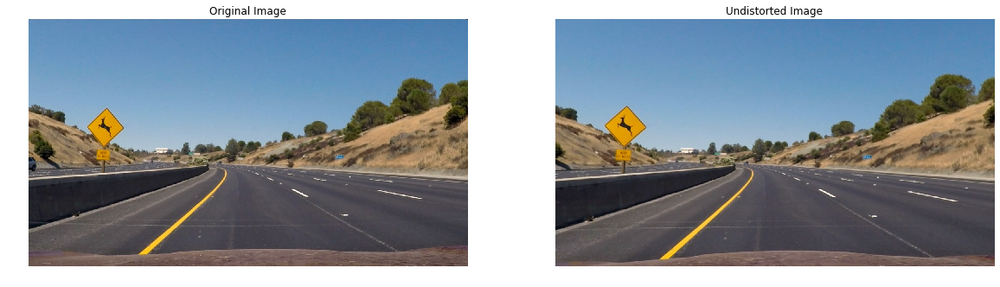

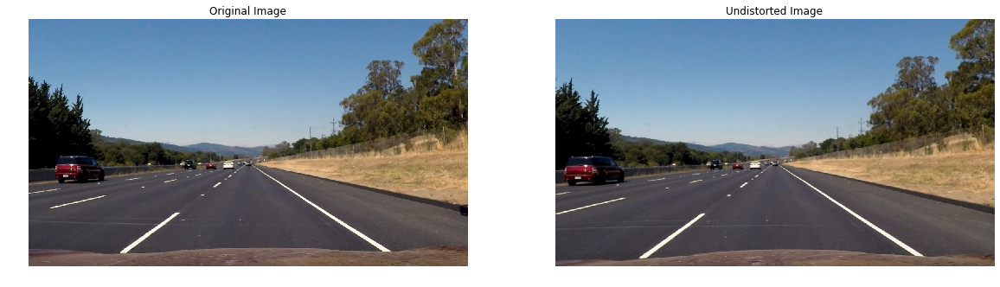

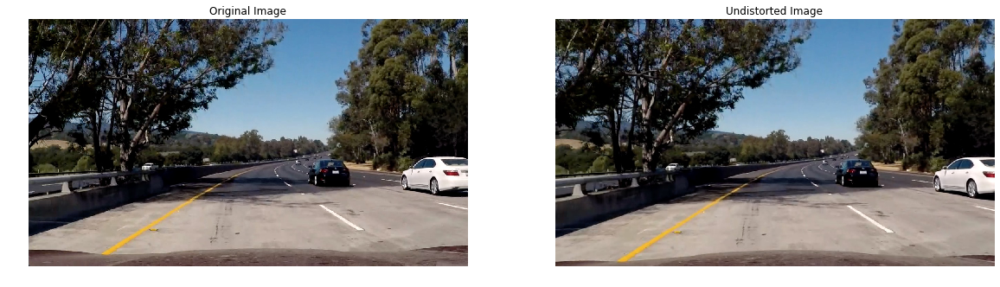

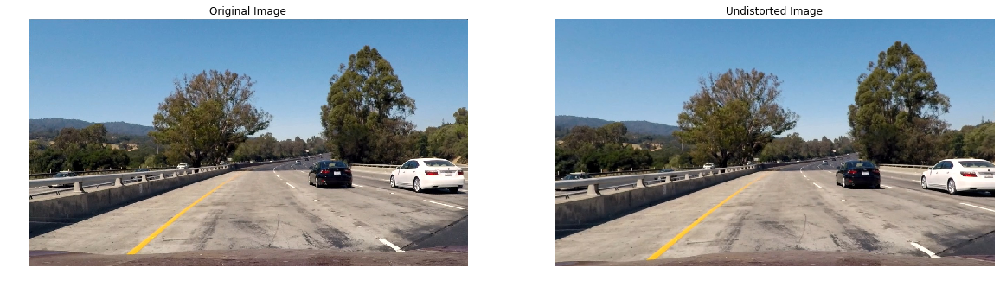

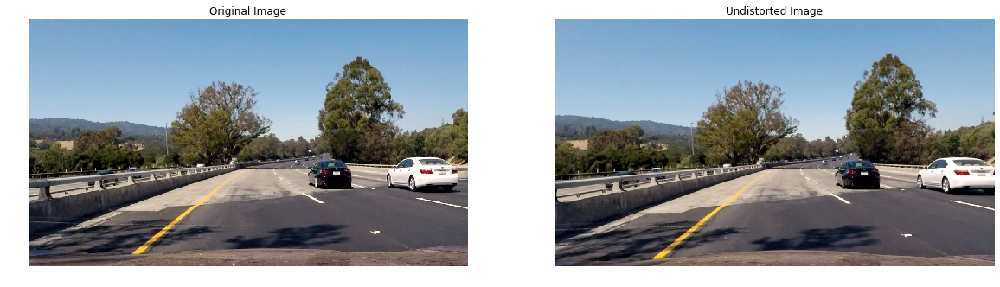

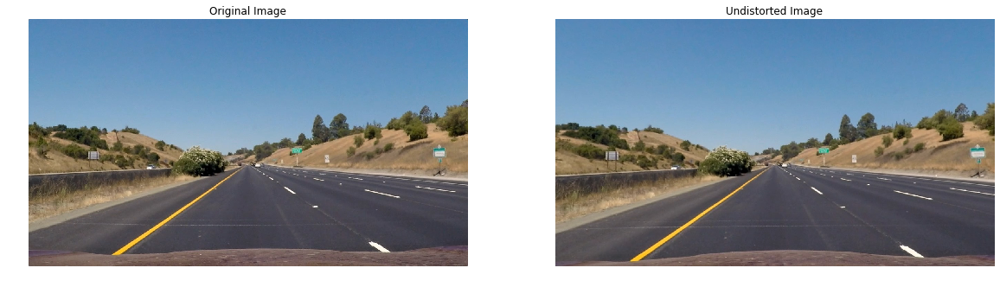

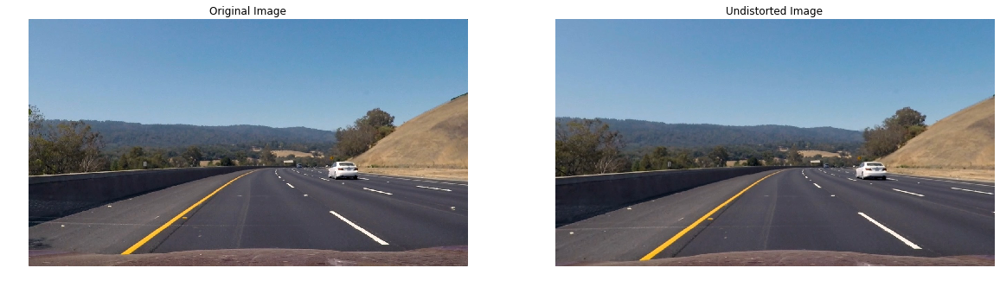

In [6]:
test_images = glob.glob( "test_images/*.jpg" )

for fileName in test_images:
    test_image = cv2.imread( fileName )
    test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
    undistorted = cv2.undistort(test_image, mtx, distCoeffs, None, mtx)

    plt.figure(figsize = (20,10))
    plt.subplot(1, 2, 1)
    plt.imshow( test_image )
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow( undistorted )
    plt.title("Undistorted Image");
    plt.axis("off")

## Find Lane Lines with Thresholded Binary Image

## Gradient and Color Transform



In this step, we will define funtions to calculate several gradient measurements (x, y, magnitude, direction and color).

Then, we will combine all the previously calculated thresholds to isolate lane-line pixels.

We use 2 kinds of gradient thresholds:

    1. Along the X axis.
    2. Directional gradient with thresholds of 30 and 90 degrees.

This is done since the lane lines are more or less vertical.

We then apply the following color thresholds:

    1. R & G channel thresholds so that yellow lanes are detected well.
    2. L channel threshold so that we don't take into account edges generated due to shadows.
    3. S channel threshold since it does a good job of separating out white & yellow lanes.

In [7]:
# load a test image, convert to RGB and undistort it
img = cv2.imread( "./test_images/test1.jpg" )
img = cv2.cvtColor( img, cv2.COLOR_BGR2RGB )
img = cv2.undistort( img, mtx, distCoeffs, None, mtx )

### Compute Directional Gradient 

In [8]:
def abs_sobel_thresh( img, orient="x", sobel_kernel=3, thresh=(0, 255) ):
    '''
    Define a function that applies Sobel x or y, 
    then takes an absolute value and applies a threshold.
    '''
    # convert to grayscale    
    gray = cv2.cvtColor( img, cv2.COLOR_RGB2GRAY )
    
    # compute the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        abs_sobel = np.absolute( cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel) )
    else:
        abs_sobel = np.absolute( cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel) )
        
    # scale to 8-bit (0-255) then convert to type = np.uint8
    scaled_sobel = np.uint8( 255 * abs_sobel/np.max(abs_sobel) )
    
    # create a mask of 1's where the scaled gradient magnitude
    # is > thresh_min and < thresh_max
    thresh_min = thresh[0]
    thresh_max = thresh[1]
    threshold_mask = (scaled_sobel > thresh_min) & (scaled_sobel <= thresh_max)
    
    binary_output = np.zeros_like( scaled_sobel )
    binary_output[ threshold_mask ] = 1
    
    # return a binary image of threshold result
    return binary_output

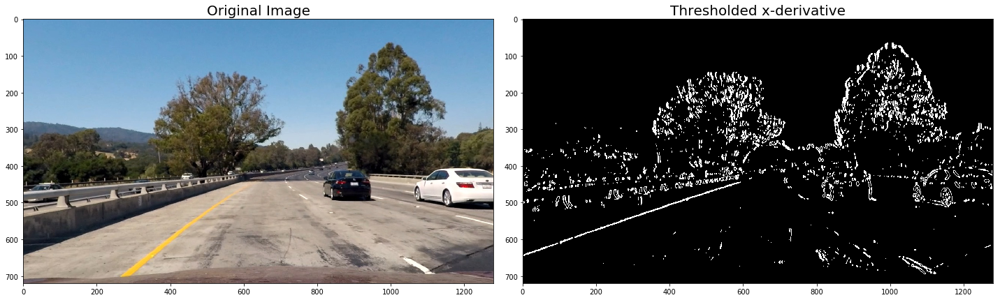

In [9]:
# apply gradient threshold on the x-gradient
sx_binary = abs_sobel_thresh( img, orient="x", sobel_kernel=15, thresh=(30, 100) )

# plot the result
plot_images( img, "Original Image", sx_binary, "Thresholded x-derivative" )

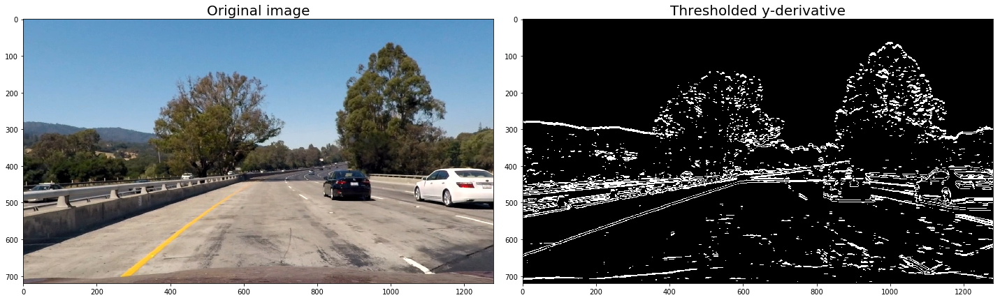

In [10]:
# apply gradient threshold on the y-gradient
sy_binary = abs_sobel_thresh( img, orient="y", sobel_kernel=15, thresh=(30, 100))

# plot the result
plot_images( img, "Original image", sy_binary, "Thresholded y-derivative" )

### Compute Gradient Magnitude

In [11]:
def mag_thresh( img, sobel_kernel=3, thresh=(25, 255) ):
    '''
    Define a function that applies Sobel x and y, 
    then computes the magnitude of the gradient
    and applies a threshold
    '''  
    # convert to grayscale    
    gray = cv2.cvtColor( img, cv2.COLOR_RGB2GRAY )
    
    # compute the gradient in x- and y- direction respectively
    sobelX = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobelY = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    
    # compute the magnitude
    sobelXY = np.sqrt( sobelX**2 + sobelY**2 )
    
    # scale to 8-bit (0-255) and convert to type = np.uint8
    scaled_sobel = np.uint8( 255 * sobelXY/np.max(sobelXY) )
    
    # create a mask of 1's where the scaled gradient magnitude
    # is > thresh_min and < thresh_max
    thresh_min = thresh[0]
    thresh_max = thresh[1]
    threshold_mask = (scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)
    
    binary_output = np.zeros_like( scaled_sobel )
    binary_output[ threshold_mask ] = 1
    
    # return a binary image of threshold result
    return binary_output

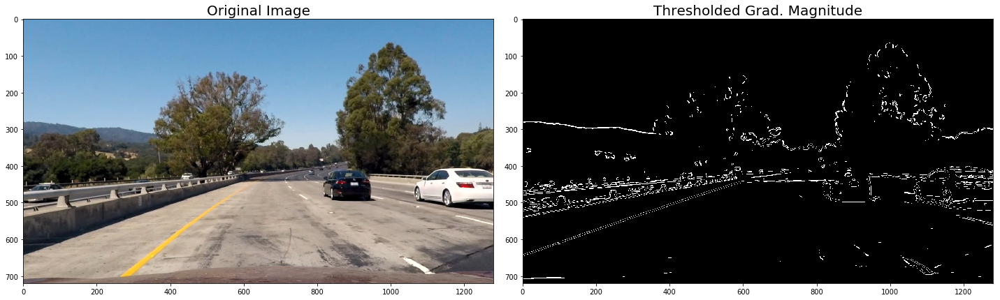

In [12]:
# apply gradient threshold on the gradient magnitude
mag_binary = mag_thresh( img, sobel_kernel=15, thresh=(70, 100) )

# plot the result
plot_images( img, "Original Image", mag_binary, "Thresholded Grad. Magnitude" )

### Compute Gradient Direction

In [13]:
def dir_thresh( img, sobel_kernel=3, thresh=(0, np.pi/2) ):
    '''
    Define a function that applies Sobel x and y, 
    then computes the direction of the gradient
    and applies a threshold.
    '''
    # convert to grayscale    
    gray = cv2.cvtColor( img, cv2.COLOR_RGB2GRAY )
    
    # compute the gradient in x- and y- direction respectively
    sobelX = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobelY = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
       
    # compute the absolute value of the x- and y- gradient, and 
    # then compute the absolute value of the gradient direction
    abs_grad_dir = np.arctan2( np.absolute(sobelY), np.absolute(sobelX) )
    
    # create a mask of 1's where the scaled gradient magnitude
    # is > thresh_min and < thresh_max
    thresh_min = thresh[0]
    thresh_max = thresh[1]
    threshold_mask = (abs_grad_dir >= thresh_min) & (abs_grad_dir <= thresh_max)
    
    binary_output = np.zeros_like( abs_grad_dir )
    binary_output[ threshold_mask ] = 1
    
    # return a binary image of threshold result
    return binary_output
    

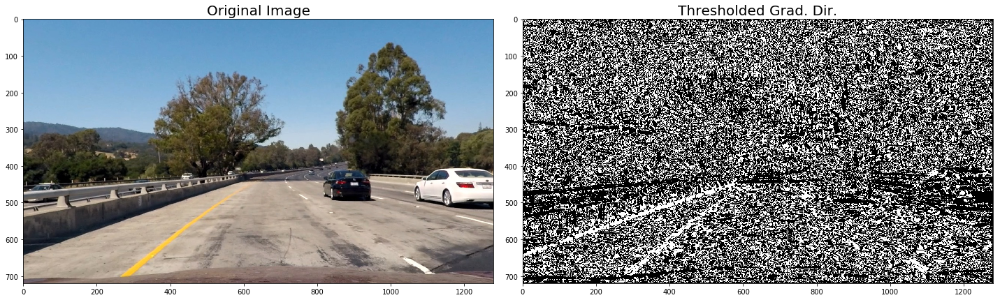

In [14]:
# apply gradient threshold on the gradient direction
dir_binary = dir_thresh( img, sobel_kernel=15, thresh=(0.7, 1.3) )

# plot the result
plot_images( img, "Original Image", dir_binary, "Thresholded Grad. Dir." )

### Compute HLS S-Channel Threshold

In [15]:
def hls_s_thresh( img, thresh=(170, 255) ):
    '''
    Define a function that thresholds the S-channel of 
    HLS Colorspace
    '''    
    # convert to HLS color space
    hls = cv2.cvtColor( img, cv2.COLOR_RGB2HLS )
    s_channel = hls[ :, :, 2]
    
    # create a mask of 1's where the intensity is
    # > thresh_min and <= thresh_max
    thresh_min = thresh[0]
    thresh_max = thresh[1]
    threshold_mask = (s_channel > thresh_min) & (s_channel <= thresh_max)
    
    binary_output = np.zeros_like( s_channel )
    binary_output[ threshold_mask ] = 1
    
    # return a binary image of threshold result
    return binary_output

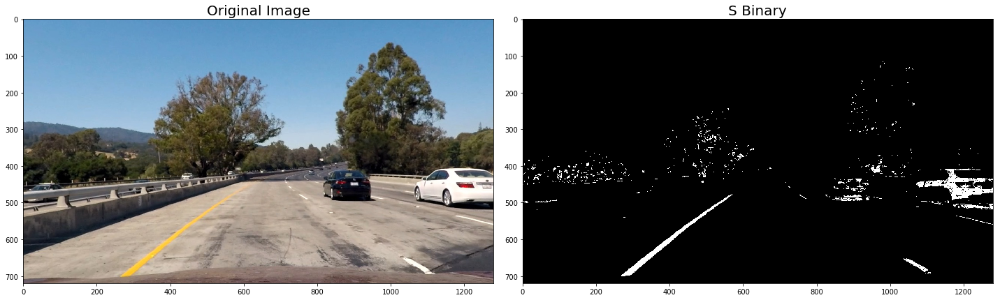

In [16]:
# apply threshold on S-channel
s_binary = hls_s_thresh( img, thresh=(170, 255) )

# plot the result
plot_images( img, "Original Image", s_binary, "S Binary" )

### Combine all Thresholds to Identify Lane Lines

In [17]:
def combine_threshs( sx_binary, sy_binary, mag_binary, dir_binary, s_binary, ksize=3 ):
    # combine the previous thresholds
    combined = np.zeros_like( sx_binary )
    combined[ ( (sx_binary == 1) & (sy_binary == 1) ) | ( (mag_binary == 1) & (dir_binary == 1)) | (s_binary == 1)] = 1

    return combined

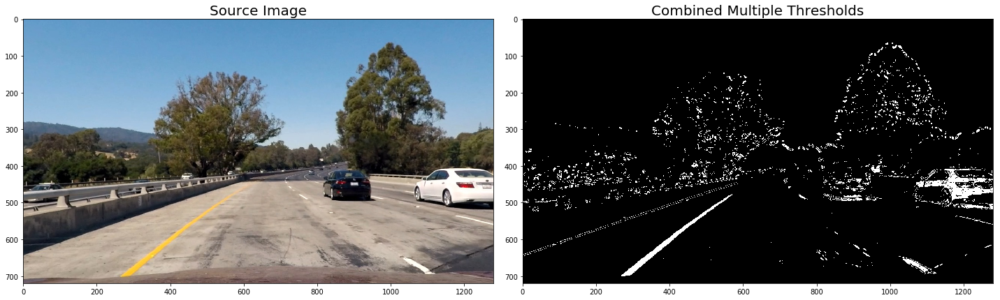

In [18]:
# run the function
combined = combine_threshs( sx_binary, sy_binary, mag_binary, dir_binary, s_binary, ksize=15 )

# plot the result
plot_images( img, "Source Image", combined, "Combined Multiple Thresholds" )

## Perspective Transform
Apply perspective transform to the test images to get a birds eye view

### Construct source and destination points in the image for determining the perspective transform matrix
Assume that road is relatively flat and camera position is fixed, so, a fixed perspective transform is appropriate

A trapezoidal region is chosen on the road looking forward and its vertices as the source points. And, a full rectangle over the image is chosen for the destination points. The vertices of the trapezoid as the source points were determined by trial and error such that they nicely include the lane lines (only) looking forward into the distance.

In [19]:
def warp( img, srcPoints=None, dstPoints=None ):
    """
    Apply perspective transformation on the given image to gain a birds-eye-view,
    based on the source and destination points.
    
    input:
        img: Image to transform
        
        src: Source points coordinates
        
        dst: Destination points coordinates
        
    output:
        Tuple of the warped image, the transform matrix and inverse transform matrix
    """
    if srcPoints is None:
        srcPoints = np.float32(
            [[280,  700],  # Bottom left
             [595,  460],  # Top left
             [725,  460],  # Top right
             [1125, 700]]) # Bottom right
        
    if dstPoints is None:
        dstPoints = np.float32(
            [[250,  720],  # Bottom left
             [250,    0],  # Top left
             [1065,   0],  # Top right
             [1065, 720]]) # Bottom right
        
    # compute the perspective transform, M, given source and destination points
    M = cv2.getPerspectiveTransform( srcPoints, dstPoints )
    
    # compute the inverse perspective transform, Minv
    Minv = cv2.getPerspectiveTransform( dstPoints, srcPoints )
       
    # warp an image using the perspective transform, M, and linear interpolation
    h, w = img.shape[ : 2]
    warped = cv2.warpPerspective( img, M, (w, h), flags=cv2.INTER_LINEAR )    

    return warped, M, Minv

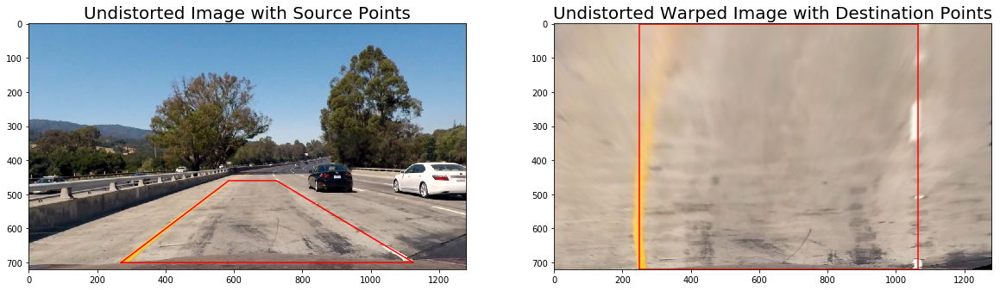

In [20]:
srcPoints = np.float32(
    [[270,  700],  # Bottom left
     [585,  460],  # Top left
     [725,  460],  # Top right
     [1125, 700]]) # Bottom right

dstPoints = np.float32(
    [[250,  720],  # Bottom left
     [250,    0],  # Top left
     [1065,   0],  # Top right
     [1065, 720]]) # Bottom right   

# run the function
warped, M, Minv  = warp( img, srcPoints, dstPoints )

# Visualize undistortion
# Notice 'img' was undistorted at the beginning
f, (ax1, ax2) = plt.subplots( 1, 2, figsize = (20,10) )
ax1.set_title( "Undistorted Image with Source Points", fontsize = 20 )
ax1.plot( Polygon(srcPoints).get_xy()[:, 0], Polygon(srcPoints).get_xy()[:, 1], color = "red" )
ax1.imshow( img )

ax2.set_title( "Undistorted Warped Image with Destination Points", fontsize = 20 )
ax2.plot( Polygon(dstPoints).get_xy()[:, 0], Polygon(dstPoints).get_xy()[:, 1], color = "red" )
ax2.imshow( warped )

### Lane Finding Method - Peak in a Histogram

In [21]:
def hist( binary_warped ):
    '''
    
    '''
    # `binary_warped` a warped binary image 
    # select only the bottom half of the image
    # lane lines are likely to be mostly vertical nearest to the car
    bottom_half = binary_warped[ binary_warped.shape[0]//2: , : ]

    # sum across image pixels vertically, `axis = 0`
    # the highest areas of vertical lines have larger values    
    histogram = np.sum( bottom_half, axis = 0 ) 
    
    return histogram

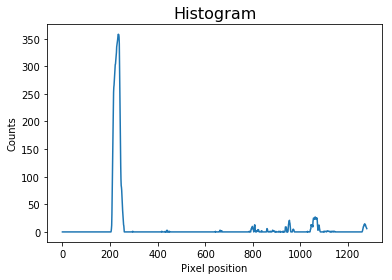

In [22]:
# run the function over the combined warped image
combined_warped = warp( combined )[0]
histogram = hist( combined_warped )

# plot the histogram
plt.title( "Histogram", fontsize = 16 )
plt.xlabel( "Pixel position" )
plt.ylabel( "Counts" )
plt.plot( histogram )

### Finding Lane Lines - Sliding Window

In [23]:
def find_lane_pixels( binary_warped, return_img=False ):
    '''
    Define method to fit polynomial to binary image with lines extracted, 
    using sliding window
    
    Find left and right lane lines in the provided binary warped image by initially
    using a histogram to find the lanes line in the bottom half of the image and then
    using a sliding window techniqe to iteratively move up and finf the next part of 
    the lane lines.
    Returns the points arrays to draw each of the left and right lanes as a 2nd order
    polynonial as well as the polynomial coefficients.
    
    :param binary_warped:
        Binary image that has already been warped (perspective transformed).
    
    :param debug:
        Draw the sliding windows onto an output image.
    
    :returns:
        left_fitx - x values for plot of left lane
        right_fitx - x values for plot of right lane
        ploty - y values for plots of left and right lanes
        left_fit - 2nd order polynomial coefficients from np.polyfit for left lane
        right_fit - 2nd order polynomial coefficients from np.polyfit for right lane
    '''
    # `binary_warped` a warped binary image 
    
    # 1. Split the histogram for the two lane lines, right and left

    # compute histogram of the bottom half of the image
    histogram = hist( binary_warped )
    
    # find the peak of the left and right halves of the histogram
    # these are the starting points for the left and right lane lines
    midpoint = np.int( histogram.shape[0] // 2 )
    leftX_base  = np.argmax( histogram[ :midpoint ] )
    rightX_base = np.argmax( histogram[ midpoint: ] ) + midpoint
    
    # 2. Set up sliding windows and windows parameters
    
    # set the number of sliding windows
    numWindows = 10
    
    # set height of windows - based on number of windows above and image shape
    window_height = np.int( binary_warped.shape[0] // numWindows )
    
    # set the width of the sliding window with +/- margin
    margin = 100
    
    # find the x- and y- indices of all the nonzero pixels in the binary image
    nonzero = binary_warped.nonzero( )
    nonzeroY = np.array( nonzero[0] )
    nonzeroX = np.array( nonzero[1] )
    
    # update x-index of center of current sliding window 
    leftWin_Xcurrent = leftX_base
    rightWin_Xcurrent = rightX_base
    
    # create empty arrays to receive left lane and right lane pixel indices
    left_lane_inds  = []
    right_lane_inds = []
    
    # set minimum number of pixels needed to re-center sliding window
    minPix = 50
    
    # create an output image to draw on and visualize the result
    out_img = np.dstack( (binary_warped, binary_warped, binary_warped) )
  
    # loop over the sliding windows one by one
    for idx in range( numWindows ):
        # compute window corners x and y indices (for both left and right windows)
        win_Ymin = binary_warped.shape[0] - ( idx + 1 ) * window_height
        win_Ymax = binary_warped.shape[0] - idx * window_height
        
        leftWin_Xmin  = leftWin_Xcurrent - margin  
        leftWin_Xmax  = leftWin_Xcurrent + margin  
        rightWin_Xmin = rightWin_Xcurrent - margin  
        rightWin_Xmax = rightWin_Xcurrent + margin 
        
        if return_img:
            # draw sliding windows on the output image
            cv2.rectangle( out_img,(leftWin_Xmin, win_Ymin),(leftWin_Xmax, win_Ymax), (0, 255, 0), 3 ) 
            cv2.rectangle( out_img,(rightWin_Xmin, win_Ymin),(rightWin_Xmax, win_Ymax), (0, 255, 0), 3) 

        # compute the x and y indices of nonzero pixels within a window
        good_left_inds = ( (nonzeroY >= win_Ymin) & (nonzeroY < win_Ymax) & 
                          (nonzeroX >= leftWin_Xmin) & (nonzeroX < leftWin_Xmax) ).nonzero( )[0]
        
        good_right_inds = ( (nonzeroY >= win_Ymin) & (nonzeroY < win_Ymax) & 
                           (nonzeroX >= rightWin_Xmin) & (nonzeroX < rightWin_Xmax) ).nonzero( )[0]
        
        # append these indices to the lists
        left_lane_inds.append( good_left_inds )
        right_lane_inds.append( good_right_inds )
        
        # if found > minPix pixels, re-center next window on their mean position
        if len( good_left_inds ) > minPix:
            leftWin_Xcurrent = np.int( np.mean( nonzeroX[good_left_inds] ) )
        if len(good_right_inds) > minPix:        
            rightWin_Xcurrent = np.int( np.mean( nonzeroX[good_right_inds] ) )
    
    # concatenate the arrays of indices
    left_lane_inds  = np.concatenate( left_lane_inds )
    right_lane_inds = np.concatenate( right_lane_inds )
        
    # extract left lane pixels x and y indices
    leftX = nonzeroX[ left_lane_inds ]
    leftY = nonzeroY[ left_lane_inds ] 
        
    # extract right line pixels x and y indices
    rightX = nonzeroX[ right_lane_inds ]
    rightY = nonzeroY[ right_lane_inds ]   
    
    # fit a second order polynomial 
    left_fit = np.polyfit( leftY, leftX, 2 )             
    right_fit = np.polyfit( rightY, rightX, 2 )
    
    # generate x and y coordinates of points on line of best fit 
    yIndices = np.linspace( 0, binary_warped.shape[0] - 1, binary_warped.shape[0] )
    
    left_Xfit = left_fit[0] * yIndices**2 + left_fit[1] * yIndices + left_fit[2]
    right_Xfit = right_fit[0] * yIndices**2 + right_fit[1] * yIndices + right_fit[2]
    
    if return_img:
        #Visualization#
        # colors in the left and right lane regions
        out_img[ leftY, leftX ]   = [ 255, 0, 0 ]
        out_img[ rightY, rightX ] = [ 0, 0, 255 ]

        # plot the polynomials on the left and right lane 
        for idx in range( img.shape[0] ):
            cv2.circle( out_img, ( int(left_Xfit[idx] ), int(yIndices[idx])), 3, (255,255,0) )
            cv2.circle( out_img, ( int(right_Xfit[idx] ), int(yIndices[idx])), 3, (255,255,0) )
        return (left_fit, right_fit), (left_Xfit, yIndices), (right_Xfit, yIndices), out_img.astype(int)
    
    else:
        return (left_fit, right_fit), (left_Xfit, yIndices), (right_Xfit, yIndices)


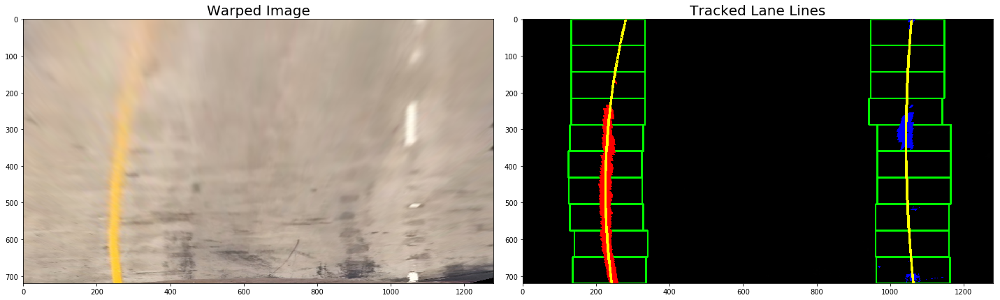

In [24]:
# run the function
lanes_fits, left_points, right_points, out_img = find_lane_pixels( combined_warped, return_img=True )

# plot the results
plot_images( warped, "Warped Image", out_img, "Tracked Lane Lines")


### Polyfit Using Fit from Previous Frame
Once we know where the lanes are from the sliding window technique above we can use a faster method by searching in a small window from where the lanes were last seen instead of blindly search across the whole width of the image
full algorithm from before and starting fresh on every frame may seem inefficient, as the lines don't necessarily move a lot from frame to frame.
a blind search again, but instead you can just search in a margin around the previous line position
once you know where the lines are in one frame of video, you can do a highly targeted search for them in the next frame.
equivalent to using a customized region of interest for each frame of video, and should help you track the lanes through sharp curves and tricky conditions

In [25]:
# Assume you now have a new warped binary image 
# from the next frame of video (also called "binary_warped")
# It's now much easier to find line pixels

def search_around_poly_fit( binary_warped, lanes_fits=None, return_img=False ):
    '''
    
    '''
    if lanes_fits is None:
        return find_lane_pixels( binary_warped, return_img )
    
    left_fit  = lanes_fits[0]
    right_fit = lanes_fits[1]
    
    # set the width of the margin around the previous polynomial to search
    margin = 100
    
    # grab activated pixels
    nonzero = binary_warped.nonzero( )
    nonzeroY = np.array( nonzero[0] )
    nonzeroX = np.array( nonzero[1] )
    
    # set the area of search based on nonzero pixels x-indices 
    # within the +/- margin of our polynomial function
    left_lane_inds = ( ( nonzeroX > (left_fit[0]*(nonzeroY**2) + left_fit[1]*nonzeroY + 
                        left_fit[2] - margin)) & (nonzeroX < (left_fit[0]*(nonzeroY**2) + 
                        left_fit[1]*nonzeroY + left_fit[2] + margin ) ) )
    
    right_lane_inds = (( nonzeroX > (right_fit[0]*(nonzeroY**2) + right_fit[1]*nonzeroY + 
                        right_fit[2] - margin)) & (nonzeroX < (right_fit[0]*(nonzeroY**2) + 
                        right_fit[1]*nonzeroY + right_fit[2] + margin ) ) )
    
    # extract left lane pixel x and y indices
    leftX = nonzeroX[ left_lane_inds ]
    leftY = nonzeroY[ left_lane_inds ]
    
    # extract right lane pixel x and y indice
    rightX = nonzeroX[ right_lane_inds ]
    rightY = nonzeroY[ right_lane_inds ]
    
    # fit new second order polynomials
    left_fit = np.polyfit( leftY, leftX, 2 )             
    right_fit = np.polyfit( rightY, rightX, 2 )  
    
    # generate x and y coordinates of points on line of best fit 
    yIndices = np.linspace( 0, binary_warped.shape[0] - 1, binary_warped.shape[0] )
    
    left_Xfit = left_fit[0] * yIndices**2 + left_fit[1] * yIndices + left_fit[2]
    right_Xfit = right_fit[0] * yIndices**2 + right_fit[1] * yIndices + right_fit[2]
                       
    if return_img:
        
        ## Visualization ##
        # create an image to draw on and an image to show the selection window
        out_img = np.dstack( (binary_warped, binary_warped, binary_warped) ) * 255
        window_img = np.zeros_like( out_img )

        # color the left and right line pixels
        out_img[ leftY, leftX ]   = [ 255, 0, 0 ]
        out_img[ rightY, rightX ] = [ 0, 0, 255 ]

        # generate a rectangular polygon to illustrate the search window and
        # recast the x and y coordinates into usable format for cv2.fillPoly()
        left_line_window1 = np.array( [np.transpose( np.vstack( [left_Xfit - margin, yIndices] ) )] )
        left_line_window2 = np.array( [np.flipud( np.transpose( np.vstack( [left_Xfit + margin, yIndices] ) ) )])
        left_line_pts = np.hstack( (left_line_window1, left_line_window2) )

        right_line_window1 = np.array( [np.transpose( np.vstack( [right_Xfit - margin, yIndices] ) )] )
        right_line_window2 = np.array( [np.flipud( np.transpose( np.vstack( [right_Xfit + margin, yIndices] ) ) )])
        right_line_pts = np.hstack( ( right_line_window1, right_line_window2 ) )

        # draw the lane onto the warped blank image
        cv2.fillPoly( window_img, np.int_( [left_line_pts] ), ( 0, 255, 0 ) )
        cv2.fillPoly( window_img, np.int_( [right_line_pts] ), ( 0, 255, 0 ) )
        out_img = cv2.addWeighted( out_img, 1, window_img, 0.3, 0)
        
        # colors in the left and right lane regions
        out_img[ leftY, leftX ]   = [ 255, 0, 0 ]
        out_img[ rightY, rightX ] = [ 0, 0, 255 ]

        # plot the polynomials on the left and right lane 
        for idx in range( img.shape[0] ):
            cv2.circle( out_img, ( int(left_Xfit[idx] ), int(yIndices[idx])), 3, (255,255,0) )
            cv2.circle( out_img, ( int(right_Xfit[idx] ), int(yIndices[idx])), 3, (255,255,0) )
        
        return (left_fit, right_fit), (left_Xfit, yIndices), (right_Xfit, yIndices), out_img
    else:
        return (left_fit, right_fit), (left_Xfit, yIndices), (right_Xfit, yIndices)
    

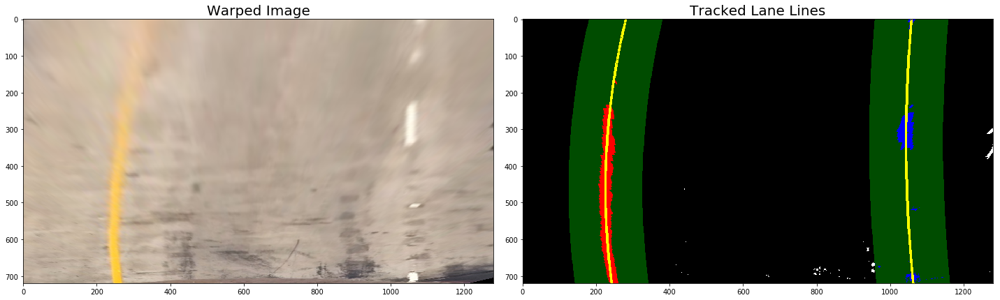

In [26]:
lanes_fits, left_points, right_points, out_img = search_around_poly_fit( combined_warped, lanes_fits, return_img=True )

# plot the results
plot_images( warped, "Warped Image", out_img, "Tracked Lane Lines" )

## Measure the Radius of Curvature and Center Offset
Since we perform the polynomial fit in pixels and whereas the curvature has to be calculated in real world measurement unit like meters, we have to use a pixel to meter transformation and then recompute the fit again.

The mean of the lane pixels closest to the car gives us the center of the lane. The center of the image gives us the reference to estimate the position of the car. The difference between the two is the offset from the center.

In [27]:
def measure_curvature_real ( left_Xfit, right_Xfit, img_shape ):
    '''
    Method to determine radius of curvature and distance from lane center 
    based on binary image, polynomial fit, and left and right lane pixels 
    x and y indices
    '''
    
    # conversions in x and y from pixels space to meters
    ym_per_pix = 30/720  # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # reverse to match top-to-bottom in y
    left_Xfit = left_Xfit[ : :-1 ]    
    right_Xfit = right_Xfit[ : :-1 ]  
    
    yIndices = np.linspace( 0, img_shape[0]-1, img_shape[0] )
    
    # determine radius of curvature at the maximum y-value,
    # corresponding to the bottom of the image
    y_eval = np.max( yIndices )
    
    # fit new polynomials to x,y in real space
    left_fit_cr = np.polyfit( yIndices* ym_per_pix, left_Xfit * xm_per_pix, 2 )
    right_fit_cr = np.polyfit( yIndices * ym_per_pix, right_Xfit * xm_per_pix, 2 )
    
    # compute the new radii of curvature, in meters
    leftCurve_rad = ( (1 + (2*left_fit_cr[0] * y_eval * ym_per_pix + left_fit_cr[1])**2)**1.5 )/np.absolute(2*left_fit_cr[0])
    rightCurve_rad = ( (1 + (2*right_fit_cr[0] * y_eval * ym_per_pix + right_fit_cr[1])**2)**1.5 )/np.absolute(2*right_fit_cr[0])
    
    return leftCurve_rad, rightCurve_rad
    

In [28]:
# run the function
leftCurve_rad, rightCurve_rad = measure_curvature_real( left_points[0], right_points[0], img.shape )

# print the radius of curvature of left and right lane
print( "Left lane line curvature: ", np.round(leftCurve_rad, 2), "m." )
print( "Right lane line curvature: ", np.round(rightCurve_rad, 2), "m." )

Left lane line curvature:  635.81 m.
Right lane line curvature:  1243.24 m.


In [29]:
def car_offset( left_Xfit, right_Xfit, img_shape ):
    '''
    
    '''
    # meters per pixel in x dimension
    xm_per_pix = 3.7 / 700
    
    # image center x coordinate 
    mid_imgX = img_shape[1] // 2
        
    # car horizontal position w.r.t the lane, in pixel
    lane_center = ( left_Xfit[-1] + right_Xfit[-1] ) / 2
    
    ## car horizontal offset w.r.t image center, in meters
    offsetX = (mid_imgX - lane_center) * xm_per_pix

    return offsetX

In [30]:
# run the function
offsetX = car_offset( left_points[0], right_points[0], img.shape )

print ( "Car offset from Center: ", np.round(offsetX, 2), "m." )

Car offset from Center:  -0.07 m.


### Warp the Detected Lane Boundaries back onto the Original Image

In [31]:
def draw_lane( img, binary_img, left_points, right_points, Minv ):
    '''
    
    '''
    # create an image to draw the lines on
    warp_zero = np.zeros_like( binary_img ).astype(np.uint8)
    color_warp = np.dstack( (warp_zero, warp_zero, warp_zero) )
    
    # recast the x and y points into usable format 
    left_Xfit = left_points[0]
    right_Xfit = right_points[0]
    yIndices = left_points[1]
    
    left_line_pixels = np.array( [np.transpose( np.vstack([left_Xfit, yIndices]) )] )
    right_line_pixels = np.array( [np.flipud( np.transpose( np.vstack([right_Xfit, yIndices]) ) )] )
    lines_pixels = np.hstack((left_line_pixels, right_line_pixels))

    # draw the lane onto the warped blank image
    cv2.fillPoly( color_warp, np.int_( [lines_pixels] ), ( 0, 255, 0 ) )

    # warp the blank back to original image space using inverse perspective matrix, Minv
    new_warp = cv2.warpPerspective( color_warp, Minv, (img.shape[1], img.shape[0]) ) 

    # combine the result with the original image
    result = cv2.addWeighted( img, 1, new_warp, 0.3, 0 )
    
    return result

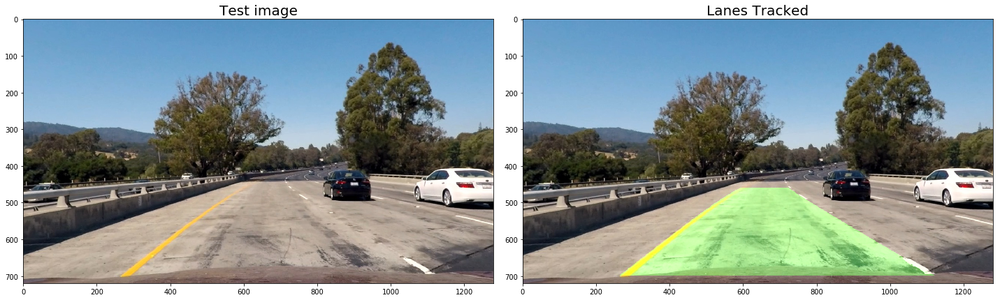

In [32]:
# run the function
img_lane = draw_lane( img, combined_warped, left_points, right_points, Minv )

# plot the results
plot_images( img, "Test image", img_lane, "Lanes Tracked")

### Display Lane Boundaries, Numerical Estimate of Lane Curvature, and Car Position

In [33]:
def add_metrics( img, left_Xfit, right_Xfit ):  
    
    # conversions in x and y from pixels space to meters
    ym_per_pix = 30/720  # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # compute radius of curvature
    leftCurve_rad, rightCurve_rad = measure_curvature_real( left_Xfit, right_Xfit, img.shape )
    
    # compute car offset
    offsetX = car_offset( left_Xfit, right_Xfit, img.shape )

    # display lane curvature
    out_img = img.copy()
    cv2.putText(out_img, 'Left lane line curvature: {:.2f} m'.format( leftCurve_rad ), 
                (60, 60), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), 5)
    
    cv2.putText(out_img, 'Right lane line curvature: {:.2f} m'.format( rightCurve_rad ), 
                (60, 110), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), 5)
    
    # display car offset
    cv2.putText(out_img, 'Horizontal car offset: {:.2f} m'.format( offsetX ), 
                (60, 160), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), 5)
    
    return out_img

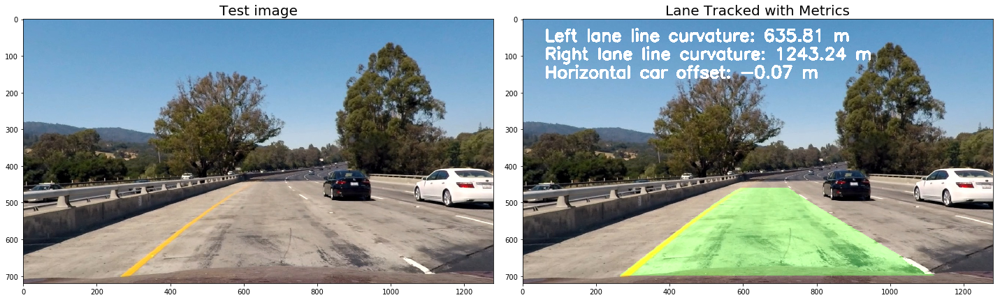

In [34]:
# run the function
out_img = add_metrics( img_lane, left_points[0], right_points[0] )

# plot the results
plot_images( img, 'Test image', out_img, 'Lane Tracked with Metrics')


## Run Pipeline on Videos

In [35]:
class ProcessImage:
    def __init__(self, images):
        
        # make a list of calibration images
        images = glob.glob( images )

        # calibrate camera
        self.ret, self.mtx, self.distCoeffs, self.rVecs, self.tVecs = calibrate_camera( images )
        self.lanes_fits = None

    def __call__(self, img):
        
        # undistorted image
        img = cv2.undistort( img, mtx, distCoeffs, None, mtx)

        # apply threshold on directional gradient
        grad_binary = abs_sobel_thresh( img, orient="x", sobel_kernel=15, thresh=(30, 100) )

        # apply threshold on gradient magnitude 
        mag_binary = mag_thresh( img, sobel_kernel=15, thresh=(50, 100) )

        # apply threshold on gradient direction
        dir_binary = dir_thresh( img, sobel_kernel=15, thresh=(0.7, 1.3) )

        # apply threshold on S-channel
        s_binary = hls_s_thresh( img, thresh=(170, 255) )
        
        # combine all the thresholds to identify the lane lines
        combined = combine_threshs( sx_binary, sy_binary, mag_binary, dir_binary, s_binary, ksize=15 )

        # apply perspective transform to binary image for birds-eye view
        srcPoints = np.float32(
                    [[270,  700],  # Bottom left
                    [585,  460],  # Top left
                    [725,  460],  # Top right
                    [1125, 700]]) # Bottom right

        dstPoints = np.float32(
                    [[250,  720],  # Bottom left
                    [250,    0],  # Top left
                    [1065,   0],  # Top right
                    [1065, 720]]) # Bottom right   

        combined_warped, M, Minv  = warp( combined, srcPoints, dstPoints )
        
        self.lanes_fits, left_points, right_points, out_img = search_around_poly_fit( combined_warped, self.lanes_fits, return_img=True )

        # warp the detected lane boundaries back onto the original image
        img_lane = draw_lane( img, combined_warped, left_points, right_points, Minv )
           
        # add metrics to the output image
        final_img = add_metrics( img_lane, left_points[0], right_points[0] )
             
        return final_img


## Test on Videos

We test our solution on the provided videos:

`project_video.mp4`

`harder_challenge_video.mp4`

In [36]:
# import everything needed to edit/save/watch video clips

from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [37]:
input_video  = "./project_video.mp4"
output_video = "./project_video_output.mp4"

## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
## clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)

clip = VideoFileClip( input_video )

# process video frames with our 'ProcessImage' class
process_image = ProcessImage( "./camera_cal/calibration*.jpg" )
output_clip = clip.fl_image( process_image ) #NOTE: this function expects color images!!
%time output_clip.write_videofile( output_video, audio=False)

Camera calibrated successfully.
[MoviePy] >>>> Building video ./project_video_output.mp4
[MoviePy] Writing video ./project_video_output.mp4


100%|█████████▉| 1260/1261 [13:20<00:00,  1.49it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./project_video_output.mp4 

CPU times: user 44min 25s, sys: 7.11 s, total: 44min 33s
Wall time: 13min 22s
